# Capítulo 13.

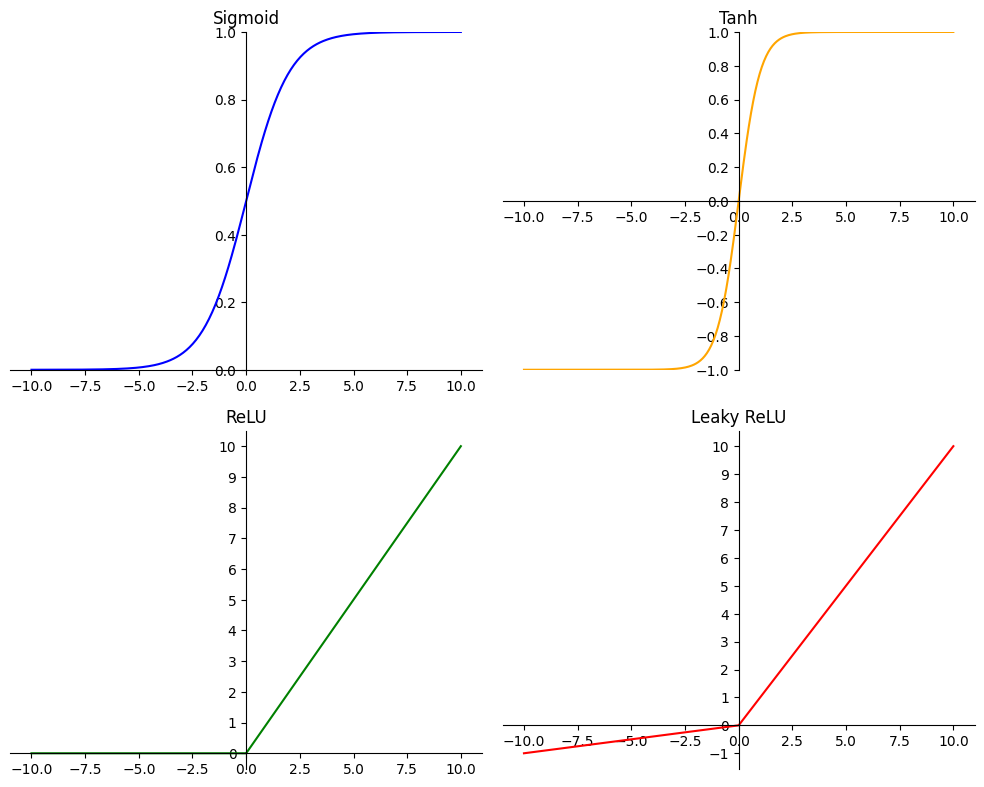

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Definición de funciones de activación
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def tanh(x):
    return np.tanh(x)

def relu(x):
    return np.maximum(0, x)

def leaky_relu(x, alpha=0.1):  # Valor de alpha aumentado para mayor visibilidad
    return np.where(x > 0, x, x * alpha)

# Crear un rango de valores x, ajustado de -10 a 10
x = np.linspace(-10, 10, 400)

# Calcular las funciones para cada valor de x
y_sigmoid = sigmoid(x)
y_tanh = tanh(x)
y_relu = relu(x)
y_leaky_relu = leaky_relu(x)

# Crear una figura y un arreglo de ejes
fig, axs = plt.subplots(2, 2, figsize=(10, 8))  # Ajustar tamaño si necesario

# Configuración de los ejes para ponerlos en el centro
def setup_axis_center(ax):
    # Mover las espinas izquierda y abajo al centro
    ax.spines['left'].set_position('zero')
    ax.spines['bottom'].set_position('zero')

    # Eliminar las espinas derecha y arriba
    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')

    # Mover las marcas de los ticks al centro
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')

# Aplicar configuraciones a cada subplot
for ax in axs.flat:
    setup_axis_center(ax)

# Dibujar cada función de activación en un subplot
axs[0, 0].plot(x, y_sigmoid, label='Sigmoid', color='blue')
axs[0, 0].set_title('Sigmoid')
axs[0, 0].set_ylim(0, 1)
axs[0, 0].set_xticks(np.arange(-10, 11, 2.5))
axs[0, 0].set_yticks(np.arange(0, 1.1, 0.2))

axs[0, 1].plot(x, y_tanh, label='Tanh', color='orange')
axs[0, 1].set_title('Tanh')
axs[0, 1].set_ylim(-1, 1)
axs[0, 1].set_xticks(np.arange(-10, 11, 2.5))
axs[0, 1].set_yticks(np.arange(-1, 1.1, 0.2))

axs[1, 0].plot(x, y_relu, label='ReLU', color='green')
axs[1, 0].set_title('ReLU')
axs[1, 0].set_xticks(np.arange(-10, 11, 2.5))
axs[1, 0].set_yticks(np.arange(0, np.max(y_relu)+1, 1))

axs[1, 1].plot(x, y_leaky_relu, label='Leaky ReLU', color='red')
axs[1, 1].set_title('Leaky ReLU')
axs[1, 1].set_xticks(np.arange(-10, 11, 2.5))
axs[1, 1].set_yticks(np.arange(np.min(y_leaky_relu), np.max(y_leaky_relu)+1, 1))

plt.tight_layout()
plt.show()


4422102/4422102 [==============================] - 0s 0us/step


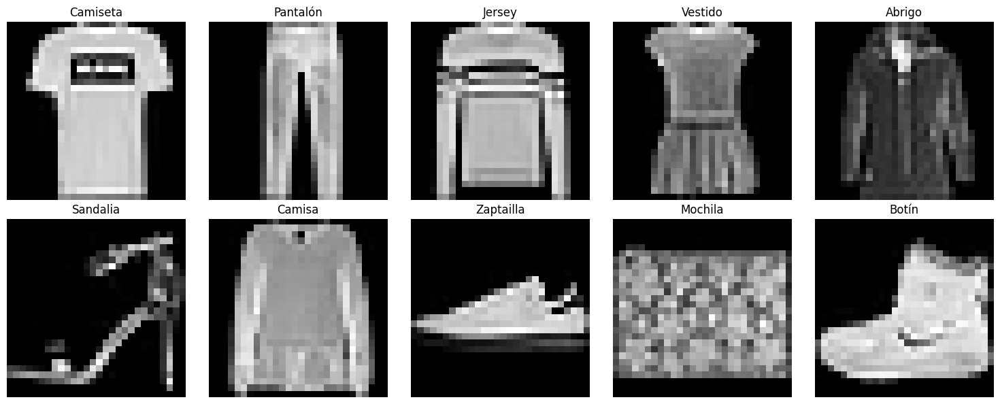

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

# Cargar el conjunto de datos Fashion MNIST
fashion_mnist = tf.keras.datasets.fashion_mnist
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

# Definir las etiquetas de las prendas de ropa
class_names = ['Camiseta', 'Pantalón', 'Jersey', 'Vestido', 'Abrigo',
               'Sandalia', 'Camisa', 'Zaptailla', 'Mochila', 'Botín']

# Crear un diccionario para almacenar una imagen de cada prenda de ropa
item_images = {}

# Recorrer el conjunto de entrenamiento para encontrar una imagen de cada prenda de ropa
for i in range(10):
    for j in range(len(train_labels)):
        if train_labels[j] == i:
            item_images[i] = train_images[j]
            break

# Crear el mosaico de imágenes
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i in range(10):
    ax = axes[i // 5, i % 5]
    ax.imshow(item_images[i], cmap='gray')
    ax.set_title(class_names[i])
    ax.axis('off')

plt.tight_layout()
plt.show()


#  Capítulo 14.

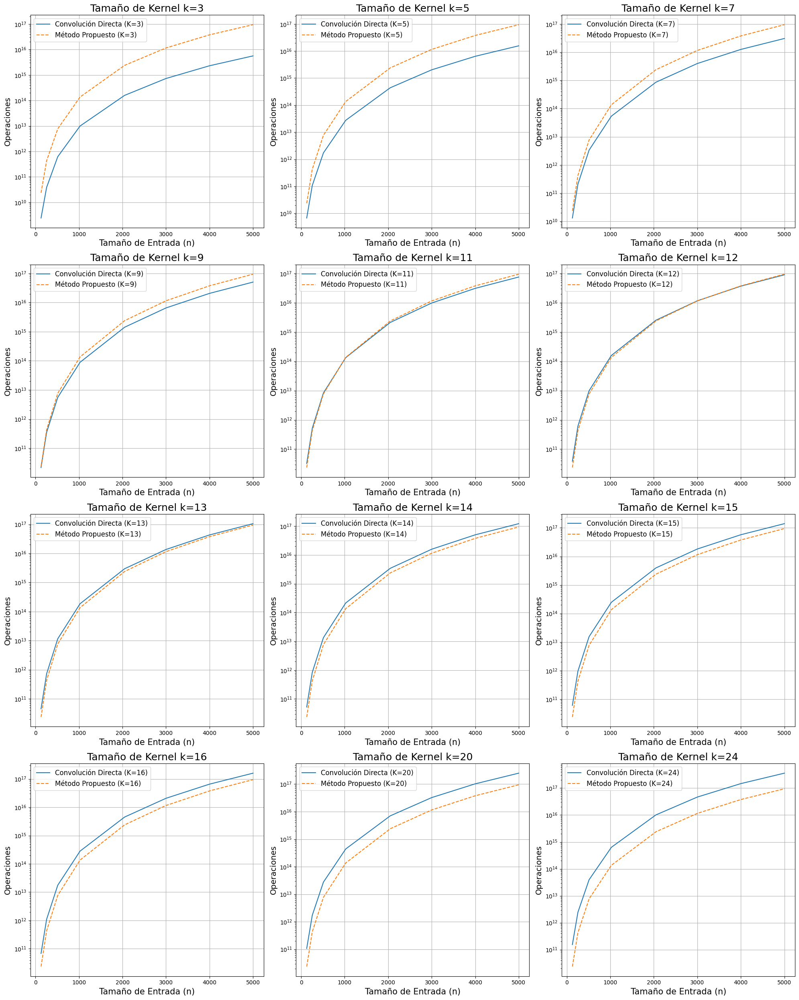

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Definir los parámetros
Ns = [128, 256, 512, 1024, 2048, 3000, 4000, 5000]  # Diferentes tamaños de entrada
Ks = [3, 5, 7, 9, 11, 12, 13, 14, 15, 16, 20, 24]  # Diferentes tamaños de kernel
C = 1  # Constante C en el método propuesto

# Funciones de complejidad
def convolucion_directa(N, K):
    return (N - K + 1)**2 * K**2

def metodo_propuesto(N, C):
    return 6 * C * N**2 * np.log2(N) + 4 * N**2

# Configurar el tamaño del mosaico
rows = 4
cols = 3
fig, axes = plt.subplots(rows, cols, figsize=(20, 25))
axes = axes.flatten()

# Generar las gráficas
for i, K in enumerate(Ks):
    ax = axes[i]
    convolucion_vals = [convolucion_directa(N*N, K) for N in Ns]
    propuesto_vals = [metodo_propuesto(N*N, C) for N in Ns]

    ax.plot(Ns, convolucion_vals, label=f'Convolución Directa (K={K})')
    ax.plot(Ns, propuesto_vals, linestyle='--', label=f'Método Propuesto (K={K})')

    ax.set_xlabel('Tamaño de Entrada (n)', fontsize=15)
    ax.set_ylabel('Operaciones', fontsize=14)
    ax.set_title(f'Tamaño de Kernel k={K}', fontsize=18)
    ax.legend(fontsize=12)
    ax.grid(True)
    ax.set_yscale('log')  # Usar escala logarítmica para mejor visualización

# Ajustar el espaciado del mosaico
plt.tight_layout()
plt.show()



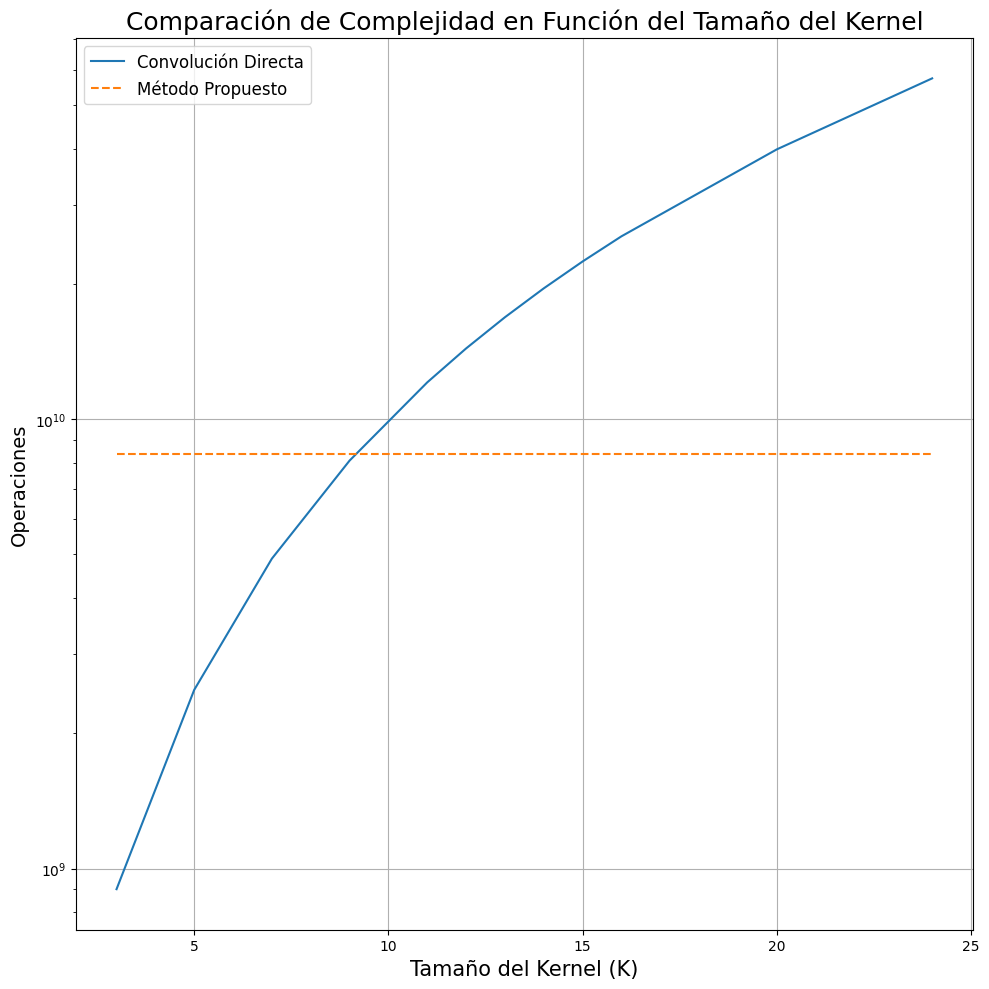

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Definir los parámetros
N = 10000  # Tamaño de entrada fijo, grande
Ks = [3, 5, 7, 9, 11, 12, 13, 14, 15, 16, 20, 24]  # Diferentes tamaños de kernel
C = 1  # Constante C en el método propuesto

# Funciones de complejidad
def convolucion_directa(N, K):
    return (N - K + 1)**2 * K**2

def metodo_propuesto(N, C):
    return 6 * C * N**2 * np.log2(N) + 4 * N**2

# Generar los valores de complejidad para diferentes tamaños de kernel
convolucion_vals = [convolucion_directa(N, K) for K in Ks]
propuesto_vals = [metodo_propuesto(N, C) for K in Ks]

# Configurar el gráfico
plt.figure(figsize=(10, 10))  # Ajustar el tamaño del gráfico a cuadrado

plt.plot(Ks, convolucion_vals, label='Convolución Directa')
plt.plot(Ks, propuesto_vals, linestyle='--', label='Método Propuesto')

plt.xlabel('Tamaño del Kernel (K)', fontsize=15)
plt.ylabel('Operaciones', fontsize=14)
plt.title('Comparación de Complejidad en Función del Tamaño del Kernel', fontsize=18)
plt.legend(fontsize=12)
plt.grid(True)
plt.yscale('log')  # Usar escala logarítmica para mejor visualización

# Mostrar el gráfico
plt.tight_layout()
plt.show()


# CAPÍTULO 11.

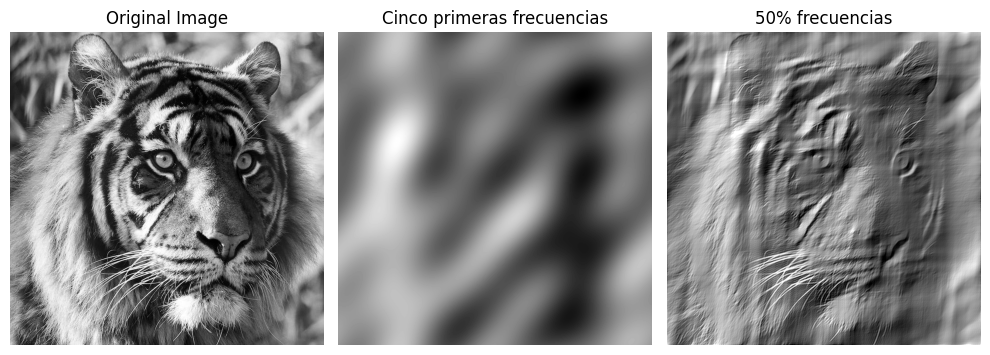

In [ ]:
from PIL import Image
from numpy.fft import rfft2, irfft2
import numpy as np
import matplotlib.pyplot as plt


def save_dims(ft, low, high):
    """Reconstruct an image using a certain range of frequencies and return it."""
    ft2 = np.zeros_like(ft)
    # Ensure 'high' does not exceed dimensions of 'ft'
    high = min(high, ft.shape[0], ft.shape[1])
    # Copy the frequencies from 'low' to 'high', all others remain zero
    ft2[low:high, low:high] = ft[low:high, low:high]
    return save(ft2)

def save(ft):
    """Perform the inverse FFT and return the image."""
    rft = irfft2(ft)
    img = Image.fromarray(np.clip(rft, 0, 255).astype('uint8'))
    img = img.convert('L')
    return img

def main():
    # Load and convert the input image to grayscale
    img_array = np.array(image)

    # Perform the Fourier Transform on the image
    ft = rfft2(img_array)

    # List of ranges to use for frequency reconstructions
    ranges = [5,min(ft.shape) //2]

    # Store images for display
    images = [image]  # Start with the original image
    titles = ['Original Image','Cinco primeras frecuencias', '50% frecuencias']  # Title for the original image

    # Generate and store images for specified frequency ranges
    for high in ranges:
        recon_img = save_dims(ft, 0, high)
        images.append(recon_img)
        #titles.append(f'Frequencies up to {high}')

    # Plotting all images in a single figure
    plt.figure(figsize=(10, 8))
    n = len(images)
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Call main to execute the code
main()


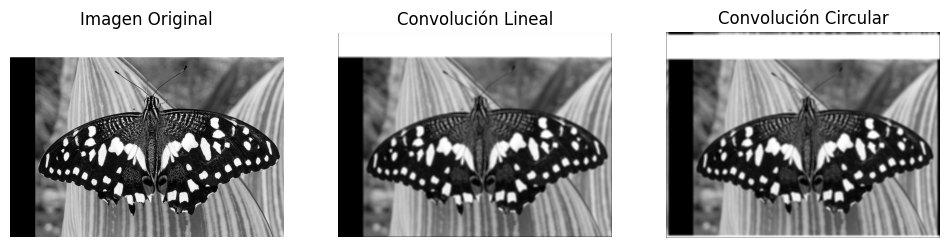

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
import cv2  # Asegúrate de importar cv2 si necesitas cargar la imagen

# Función de convolución circular
def circular_convolution(matrix, kernel):
    pad_size = max(kernel.shape)  # Asegúrate de que el padding es al menos del tamaño del kernel
    extended_matrix = np.pad(matrix, [(pad_size, pad_size), (pad_size, pad_size)], mode='wrap')
    result = convolve2d(extended_matrix, kernel, mode='same')  # Usar 'same' mantiene el tamaño original
    return result

kernel = np.array([
    [6000, 6000, 6000,6000,6000],
    [6000, 6000, 6000,6000,6000],
    [6000, 6000, 6000,6000,6000],
    [6000, 6000, 6000,6000,6000],
    [6000, 6000, 6000,6000,6000]
])

# Convolución lineal
result_linear = convolve2d(image_with_borders, kernel, mode='same', boundary='fill', fillvalue=0)

# Convolución circular
result_circular = circular_convolution(image_with_borders, kernel)

# Mostrar los resultados
plt.figure(figsize=(12, 4))

# Imagen original
plt.subplot(1, 3, 1)
plt.imshow(image_with_borders, cmap='gray')
plt.title('Imagen Original')
plt.axis('off')

# Resultado de la convolución lineal
plt.subplot(1, 3, 2)
plt.imshow(result_linear, cmap='gray')
plt.title('Convolución Lineal')
plt.axis('off')

# Resultado de la convolución circular
plt.subplot(1, 3, 3)
plt.imshow(result_circular, cmap='gray')
plt.title('Convolución Circular')
plt.axis('off')

plt.show()


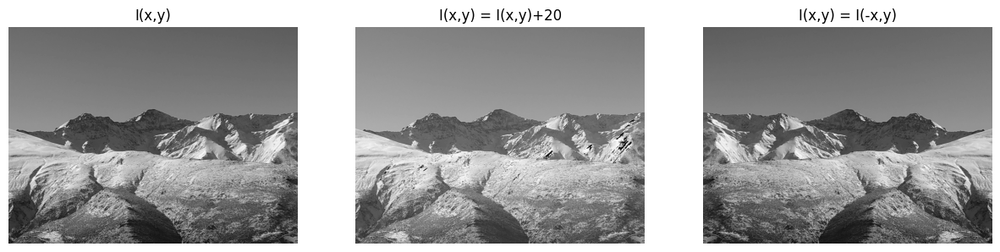

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Ruta al archivo en Google Drive
file_path = '/content/drive/My Drive/images (1)/IMG_20220312_102944_S.jpg'

# Cargar la imagen en escala de grises
image = cv2.imread(file_path, 0)

# Aumentar el brillo manualmente sumando 20 a cada píxel
bright_image_manual = np.clip(image + 20, 0, 255)  # np.clip para evitar desbordamiento

# Invertir la imagen horizontalmente
flipped_image = cv2.flip(image, 1)

# Mostrar las imágenes en un mosaico

# Configuración de la figura de Matplotlib
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 fila, 3 columnas

# Mostrar imagen original
axs[0].imshow(image, cmap='gray')
axs[0].set_title('I(x,y)')
axs[0].axis('off')  # Ocultar los ejes

# Mostrar imagen con brillo aumentado
axs[1].imshow(bright_image_manual, cmap='gray')
axs[1].set_title('I(x,y) = I(x,y)+20')
axs[1].axis('off')  # Ocultar los ejes

# Mostrar imagen invertida
axs[2].imshow(flipped_image, cmap='gray')
axs[2].set_title('I(x,y) = I(-x,y)')
axs[2].axis('off')  # Ocultar los ejes

# Mostrar todas las gráficas
plt.show()


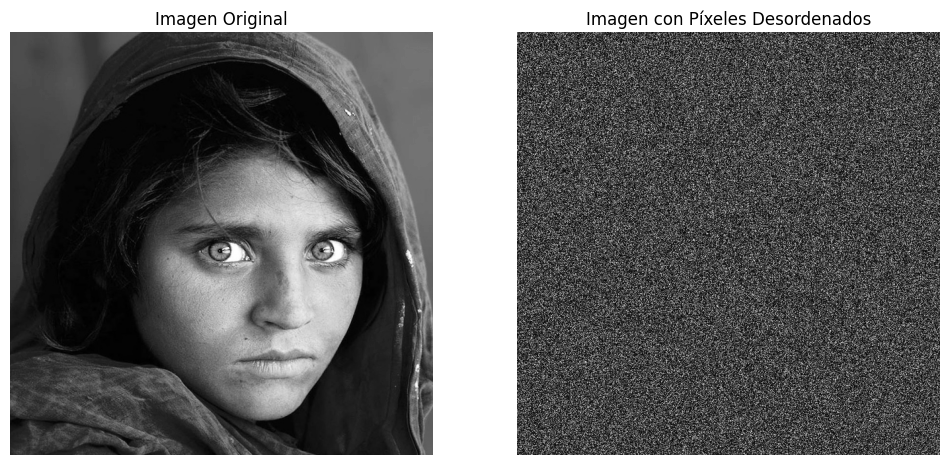

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Cargar la imagen en blanco y negro
image_array = np.array(image)

# Obtener las dimensiones de la imagen
rows, cols = image_array.shape

# Aplanar la imagen para mezclar los píxeles
flat_image_array = image_array.flatten()

# Mezclar aleatoriamente los píxeles
np.random.shuffle(flat_image_array)

# Reorganizar la imagen de nuevo a su forma original
shuffled_image_array = flat_image_array.reshape(rows, cols)

# Mostrar ambas imágenes
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Imagen Original')
plt.axis('off')  # Ocultar los ejes

plt.subplot(1, 2, 2)
plt.imshow(shuffled_image_array, cmap='gray')
plt.title('Imagen con Píxeles Desordenados')
plt.axis('off')  # Ocultar los ejes

plt.show()


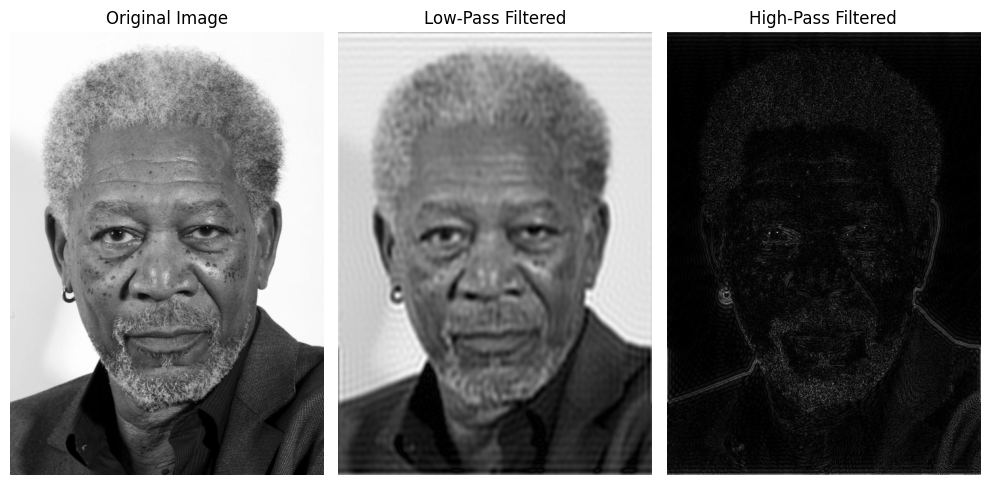

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def load_image(image_path):
    """Carga una imagen y la convierte en escala de grises."""
    img = Image.open(image_path).convert('L')
    img_array = np.array(img)
    return img_array

def fft_transform(img_array):
    """Realiza la Transformada de Fourier y retorna el resultado y el espectro desplazado."""
    fft_result = np.fft.fft2(img_array)
    fft_shifted = np.fft.fftshift(fft_result)  # Desplaza el cero de frecuencia al centro
    return fft_shifted

def ifft_transform(fft_shifted):
    """Realiza la Transformada Inversa de Fourier."""
    ifft_shifted = np.fft.ifftshift(fft_shifted)  # Vuelve a colocar el cero de frecuencia en la esquina
    img_back = np.fft.ifft2(ifft_shifted)
    return np.abs(img_back)

def apply_low_pass_filter(fft_shifted, radius):
    """Aplica un filtro pasa-bajos sobre el espectro de Fourier."""
    rows, cols = fft_shifted.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.zeros((rows, cols), dtype=bool)
    y, x = np.ogrid[:rows, :cols]
    mask_area = (x - center_col)**2 + (y - center_row)**2 <= radius**2
    mask[mask_area] = True
    fft_shifted[~mask] = 0
    return fft_shifted

def apply_high_pass_filter(fft_shifted, radius):
    """Aplica un filtro pasa-altos sobre el espectro de Fourier."""
    rows, cols = fft_shifted.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.zeros((rows, cols), dtype=bool)
    y, x = np.ogrid[:rows, :cols]
    mask_area = (x - center_col)**2 + (y - center_row)**2 <= radius**2
    fft_shifted[mask_area] = 0
    return fft_shifted

def plot_images(images, titles):
    """Muestra un mosaico de imágenes."""
    plt.figure(figsize=(10, 5))
    for i, (image, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        plt.imshow(image, cmap='gray')
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

def main():

    fft_shifted = fft_transform(image)
    low_pass_img = ifft_transform(apply_low_pass_filter(fft_shifted.copy(), 50))
    high_pass_img = ifft_transform(apply_high_pass_filter(fft_shifted.copy(), 50))

    plot_images([image, low_pass_img, high_pass_img], ['Original Image', 'Low-Pass Filtered', 'High-Pass Filtered'])

main()


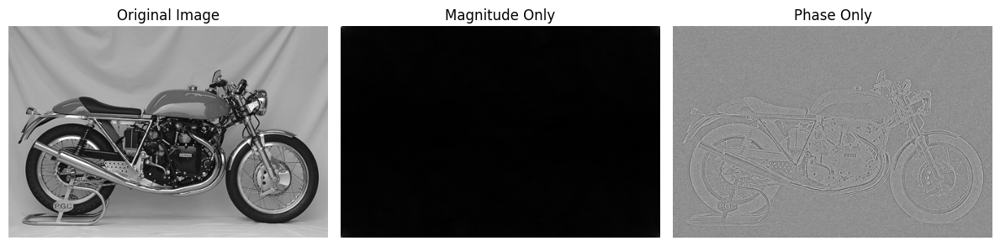

In [ ]:
import numpy as np
import matplotlib.pyplot as plt



def fft_image(img_array):
    """Aplica FFT a la imagen y devuelve la magnitud y la fase."""
    fft_result = np.fft.fft2(img_array)
    fft_shifted = np.fft.fftshift(fft_result)  # Centrar el espectro para visualización y manipulación
    magnitude = np.abs(fft_shifted)
    phase = np.angle(fft_shifted)
    return magnitude, phase

def reconstruct_magnitude_only(magnitude):
    """Reconstruye la imagen utilizando solo la magnitud (fase a cero)."""
    phase = np.zeros(magnitude.shape)
    complex_image = np.exp(1j * phase) * magnitude
    ifft_result = np.fft.ifftshift(complex_image)  # Descentrar antes de la transformada inversa
    return np.fft.ifft2(ifft_result).real

def reconstruct_phase_only(phase):
    """Reconstruye la imagen utilizando solo la fase (magnitud normalizada a un valor apropiado)."""
    magnitude = np.full(phase.shape, np.mean(phase))  # Utiliza un valor de magnitud que sea más apropiado
    complex_image = np.exp(1j * phase) * magnitude
    return np.fft.ifft2(np.fft.ifftshift(complex_image)).real

def plot_images(images, titles):
    """Dibuja un mosaico de imágenes."""
    plt.figure(figsize=(12, 4))
    for i, (image, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        plt.imshow(image, cmap='gray', vmin=np.min(image), vmax=np.max(image))  # Ajusta rango para cada imagen
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

def main():
    # Asegúrate de cambiar 'path_to_your_image.jpg' a la ruta correcta de tu imagen
    img_array = image

    # Obtener magnitud y fase con FFT
    magnitude, phase = fft_image(img_array)

    # Reconstruir imágenes
    img_magnitude_only = reconstruct_magnitude_only(magnitude)
    img_phase_only = reconstruct_phase_only(phase)

    # Mostrar imágenes
    plot_images(
        [img_array, img_magnitude_only, img_phase_only],
        ['Original Image', 'Magnitude Only', 'Phase Only']
    )

# Ejecutar el código principal
main()


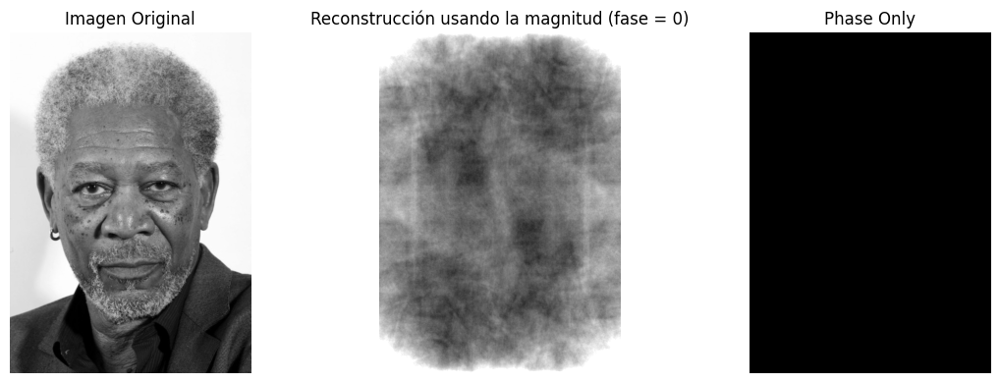

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def load_image(image_path):
    """Carga una imagen y la convierte en escala de grises."""
    img = Image.open(image_path).convert('L')
    img_array = np.array(img)
    return img_array

def fft_image(img_array):
    """Aplica FFT a la imagen y devuelve la magnitud y la fase."""
    fft_result = np.fft.fft2(img_array)
    fft_shifted = np.fft.fftshift(fft_result)  # Centrar el espectro para visualización y manipulación
    magnitude = np.abs(fft_shifted)
    phase = np.angle(fft_shifted)
    return magnitude, phase

def reconstruct_magnitude_only(magnitude):
    """Reconstruye la imagen utilizando solo la magnitud (fase a cero)."""
    phase = np.zeros(magnitude.shape)
    complex_image = np.exp(1j * phase) * magnitude
    ifft_result = np.fft.ifftshift(complex_image)  # Descentrar antes de la transformada inversa
    return np.fft.ifft2(ifft_result).real

def reconstruct_phase_only(phase):
    """Reconstruye la imagen utilizando solo la fase (magnitud normalizada a 1)."""
    magnitude = np.ones(phase.shape)
    complex_image = np.exp(1j * phase) * magnitude
    return np.fft.ifft2(complex_image).real

def plot_images(images, titles):
    """Dibuja un mosaico de imágenes."""
    plt.figure(figsize=(12, 4))
    for i, (image, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        plt.imshow(image, cmap='gray', vmin=0, vmax=255)
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

def main():
    # Cargar imagen
    img_array = image

    # Obtener magnitud y fase con FFT
    magnitude, phase = fft_image(img_array)

    # Reconstruir imágenes
    img_magnitude_only = reconstruct_magnitude_only(magnitude)
    img_phase_only = reconstruct_phase_only(phase)

    # Mostrar imágenes
    plot_images(
        [img_array, img_magnitude_only, img_phase_only],
        ['Imagen Original', 'Reconstrucción usando la magnitud (fase = 0)', 'Phase Only']
    )

# Ejecutar el código principal
main()


/content/drive/My Drive


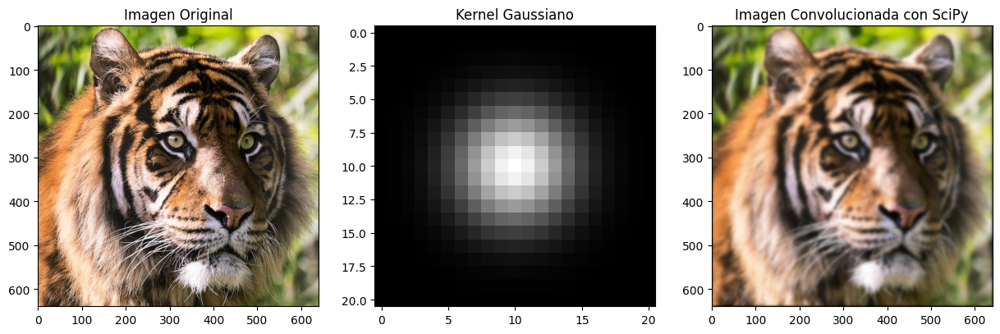

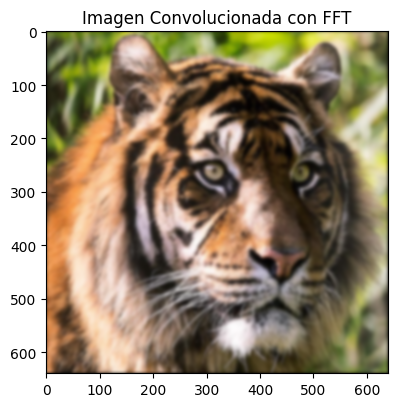

Máximo valor en la diferencia entre las imágenes: 1.0


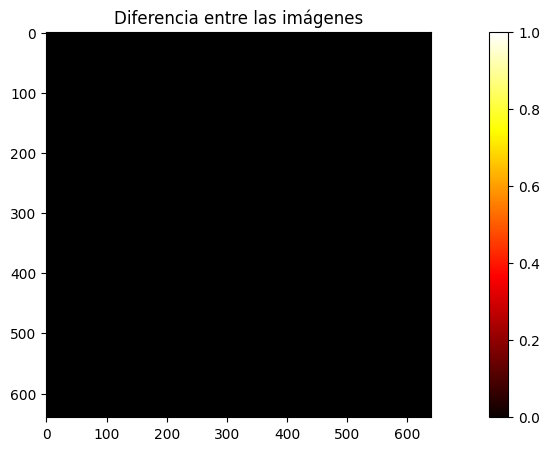

In [ ]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy.signal import convolve2d  # Importar scipy.signal.convolve2d
from scipy.ndimage import convolve  # Importar scipy.ndimage.convolve
import time
# Cambiamos el directorio de trabajo
%cd '/content/drive/My Drive'

# Verificamos el directorio actual
%pwd

# Esto permite mostrar imágenes y guardarlas en las celdas
%matplotlib inline

# Definición para leer archivos en una ruta específica
get_image = lambda route: os.path.join('/content/drive/My Drive/images (1)', route)

# Función para la convolución utilizando scipy.signal.convolve2d
def convolution_scipy(image, kernel):
    output = np.zeros_like(image)
    for c in range(image.shape[2]):
        output[:, :, c] = convolve2d(image[:, :, c], kernel, mode='same', boundary='fill', fillvalue=0)
    return output

# Definir un kernel de suavizado (gaussiano)
def gaussian_kernel(size, sigma=1):
    """Genera un kernel gaussiano."""
    x, y = np.mgrid[-size//2 + 1:size//2 + 1, -size//2 + 1:size//2 + 1]
    g = np.exp(-((x**2 + y**2) / (2.0 * sigma**2)))
    return g / g.sum()

# Cargar una imagen en color
image_path = get_image('tigre.jpeg')
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convertir a RGB

# Generar un kernel gaussiano de suavizado
kernel_size = 21
sigma = 3
g = gaussian_kernel(kernel_size, sigma)

# Aplicar el filtro a cada canal de la imagen usando scipy.ndimage.convolve
conv_image_scipy = np.zeros_like(image)
for i in range(3):  # Suponemos que la imagen tiene 3 canales
    conv_image_scipy[:, :, i] = convolve(image[:, :, i], g, mode='constant', cval=0.0)

# Ajustar la imagen resultante según sea necesario
conv_image_scipy = np.clip(conv_image_scipy, 0, 255).astype(np.uint8)

# Mostrar y guardar las imágenes
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title('Imagen Original')

plt.subplot(1, 3, 2)
plt.imshow(g, cmap='gray')
plt.title('Kernel Gaussiano')

plt.subplot(1, 3, 3)
plt.imshow(conv_image_scipy)
plt.title('Imagen Convolucionada con SciPy')

plt.savefig('convolution_results_color_scipy.png')
plt.show()

# Guardar las imágenes
plt.imsave('image.png', image)
plt.imsave('g.png', g, cmap='gray')
plt.imsave('conv_image_scipy_correct.png', conv_image_scipy)

# Definir la función de convolución FFT (usando previamente definida)
def convolution_fft_diapositiva(image, kernel):
    # Ajustar el tamaño del kernel para que coincida con la imagen
    H,W = image.shape
    hs = kernel.shape[0]//2
    #fftsize=2048
    fftsize = max(2**int(np.ceil(np.log2(H + hs))), 2**int(np.ceil(np.log2(W + hs))))
    start_time = time.time()
    # Calcular la Transformada de Fourier de la imagen y el kernel
    image_fft = np.fft.fft2(image,(fftsize,fftsize))       #padding
    kernel_fft = np.fft.fft2(kernel, (fftsize,fftsize))    #padding
    # Multiplicar en el dominio de la frecuencia
    result_fft = image_fft * kernel_fft              #multiply fft images
    # Aplicar la Transformada Inversa de Fourier para obtener la convolución
    result_inversa = np.fft.ifft2(result_fft)         #inverse fft2
    result_inversa = result_inversa[hs:hs+H,hs:hs+W]  #remove padding
    result_inversa = np.real(result_inversa)
    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Tiempo de convolución con fftconvolve:", elapsed_time, "segundos")
    return result_inversa

def convolution_fft_gpu(image, kernel):
    H, W = image.shape
    hs = kernel.shape[0] // 2

    # Calcula el tamaño de relleno en función de la potencia de 2 más cercana a las dimensiones originales
    fftsize = 2**int(np.ceil(np.log2(max(H, W) + hs)))

     # Ajustar la forma del kernel para que coincida con la forma (fftsize,fftsize)
    kernel_shape = tf.shape(kernel)
    padded_kernel = tf.pad(kernel, [(0, fftsize - kernel_shape[0]), (0, fftsize - kernel_shape[1])])
    kernel_fft = tf.signal.fft2d(tf.cast(padded_kernel, tf.complex64))

    # Ajustar la forma de la imagen para que coincida con la forma (fftsize,fftsize)
    image_shape = tf.shape(image)
    padded_image = tf.pad(image, [(0, fftsize - image_shape[0]), (0, fftsize - image_shape[1])])
    image_fft = tf.signal.fft2d(tf.cast(padded_image, tf.complex64))

    # Realiza la multiplicación en el dominio de la frecuencia
    result_fft = image_fft * kernel_fft

    # Aplica la Transformada Inversa de Fourier para obtener la convolución
    result_inversa = tf.signal.ifft2d(result_fft)

    # Aplica el recorte para eliminar el relleno
    result_inversa = result_inversa[hs:hs+H, hs:hs+W]


    return tf.math.real(result_inversa).numpy()
def convolution_fft_diapositiva2(image, kernel):
    # Preparar las matrices para el resultado
    result_inversa = np.zeros_like(image)

    # Procesar cada canal de la imagen
    for channel in range(image.shape[2]):
        result_inversa[:, :, channel] = convolution_fft_diapositiva(image[:, :, channel], kernel)

    return result_inversa

# Calcular la convolución FFT
conv_image_fft = convolution_fft_diapositiva2(image, g)
conv_image_fft = np.clip(conv_image_fft, 0, 255).astype(np.uint8)  # Recortar los valores y convertir a uint8

# Mostrar los resultados de la convolución FFT
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(conv_image_fft)
plt.title('Imagen Convolucionada con FFT')

plt.savefig('convolution_results_color_fft.png')
plt.show()

# Guardar las imágenes
plt.imsave('conv_image_fft_correct.png', conv_image_fft)

# Calcular y mostrar la diferencia
difference = cv2.absdiff(conv_image_scipy.astype(np.float32), conv_image_fft.astype(np.float32))
max_difference = np.max(difference)  # Obtener el valor máximo de la diferencia
print("Máximo valor en la diferencia entre las imágenes:", round(max_difference, 2))

# Mostrar la diferencia
plt.figure(figsize=(15, 5))
plt.imshow(difference.astype(np.uint8), cmap='hot')
plt.title('Diferencia entre las imágenes')
plt.colorbar()
plt.show()


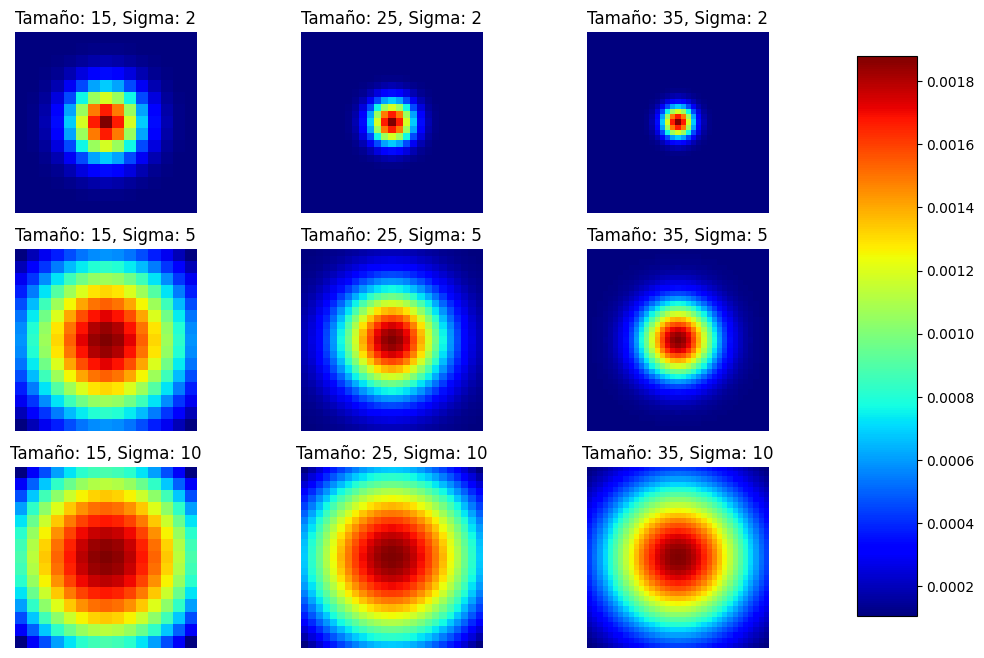

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_gaussian_kernel(size, sigma):
    """Genera un kernel gaussiano."""
    ax = np.linspace(-(size // 2), size // 2, size)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    kernel /= np.sum(kernel)
    return kernel

def plot_kernels(kernels, sigmas, sizes):
    """Muestra un mosaico de kernels gaussianos."""
    fig, axes = plt.subplots(nrows=len(sigmas), ncols=len(sizes), figsize=(12, 8))

    for i, sigma in enumerate(sigmas):
        for j, size in enumerate(sizes):
            kernel = kernels[i][j]
            ax = axes[i, j]
            im = ax.imshow(kernel, interpolation='none', cmap='jet')
            ax.set_title(f'Tamaño: {size}, Sigma: {sigma}')
            ax.axis('off')

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    fig.colorbar(im, cax=cbar_ax)
    plt.show()

def main():
    sigmas = [2, 5, 10]  # Diferentes valores de sigma
    sizes = [15, 25, 35]  # Diferentes tamaños del kernel

    kernels = [[generate_gaussian_kernel(size, sigma) for size in sizes] for sigma in sigmas]
    plot_kernels(kernels, sigmas, sizes)

main()


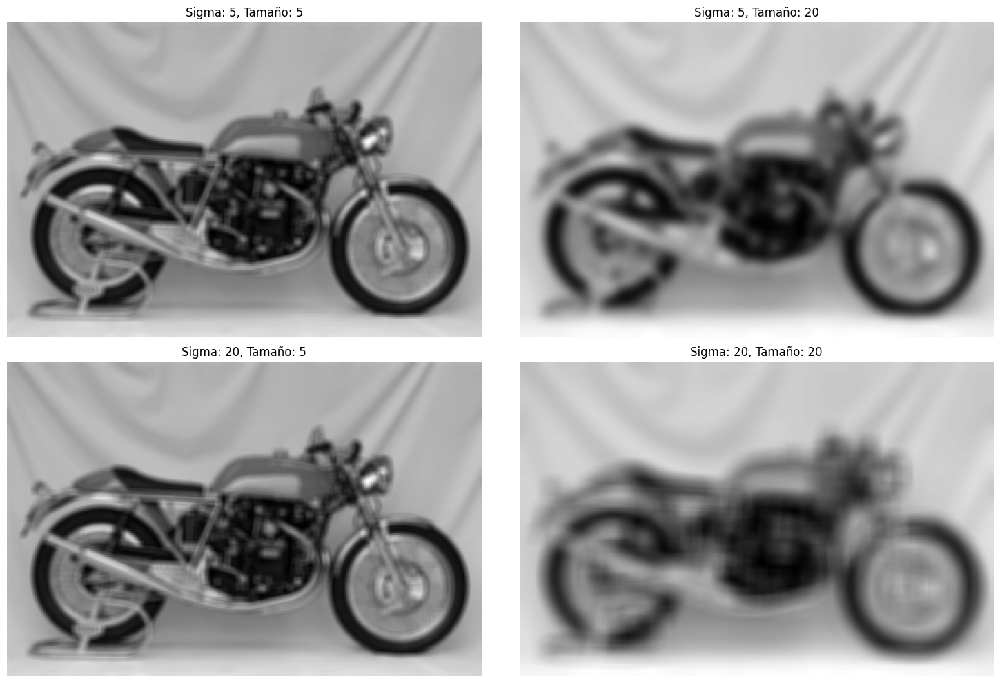

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from PIL import Image

def load_image(image_path):
    """Carga una imagen y la convierte en escala de grises."""
    img = Image.open(image_image_path).convert('L')
    img_array = np.array(img)
    return img_array

def apply_gaussian_filter(img_array, sigma, size):
    """Aplica un filtro gaussiano a la imagen."""
    # Recortar el kernel a un tamaño específico no es directamente posible con gaussian_filter,
    # así que aplicamos el filtro directamente con el sigma proporcionado.
    return gaussian_filter(img_array, sigma=sigma, truncate=size/(2*sigma))

def plot_images(images, titles, figsize=(15, 10)):
    """Muestra un mosaico de imágenes con sus títulos."""
    rows = len(images)
    cols = len(images[0])  # Asumimos que todas las filas tienen el mismo número de columnas
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    for i, row in enumerate(images):
        for j, img in enumerate(row):
            ax = axes[i, j] if rows > 1 else axes[j]
            ax.imshow(img, cmap='gray')
            ax.set_title(titles[i][j])
            ax.axis('off')
    plt.tight_layout()
    plt.show()

def main():

    sigmas = [5, 20]  # Diferentes valores de sigma
    sizes = [5, 20]  # Diferentes tamaños del kernel

    filtered_images = []
    titles = []

    for sigma in sigmas:
        row_images = []
        row_titles = []
        for size in sizes:
            filtered_img = apply_gaussian_filter(image, sigma, size)
            row_images.append(filtered_img)
            row_titles.append(f'Sigma: {sigma}, Tamaño: {size}')
        filtered_images.append(row_images)
        titles.append(row_titles)

    plot_images(filtered_images, titles)

main()


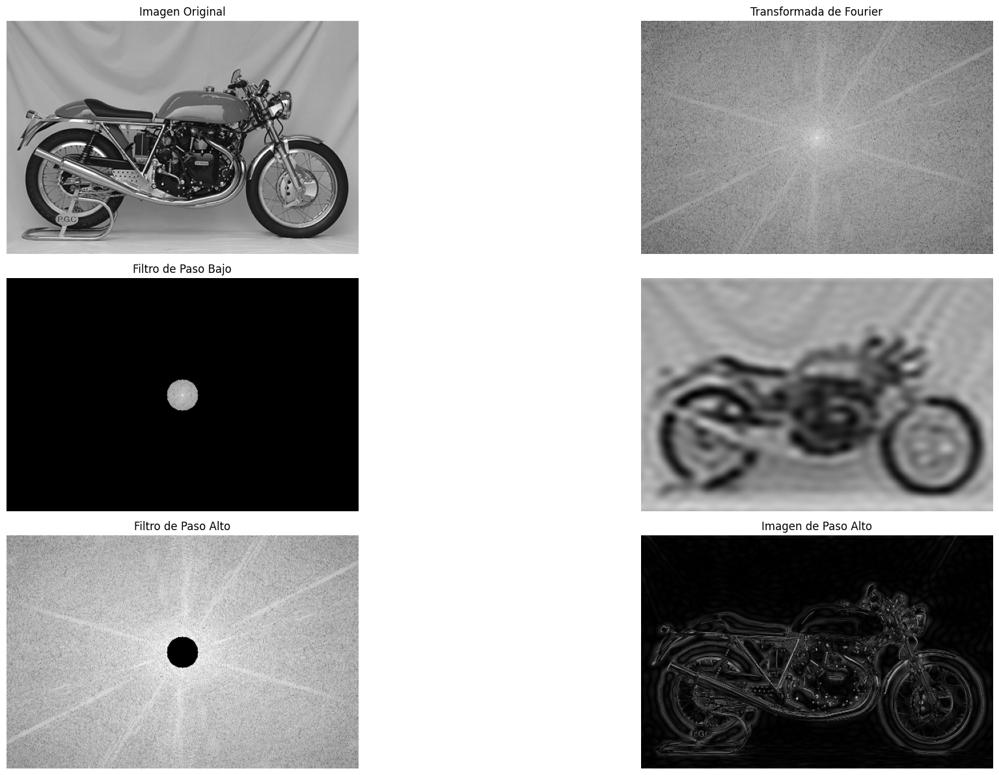

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def load_image(image_path):
    """Carga una imagen y la convierte en escala de grises."""
    img = Image.open(image_path).convert('L')
    img_array = np.array(img)
    return img_array

def fft_transform(img_array):
    """Realiza la Transformada de Fourier y retorna el resultado y el espectro desplazado."""
    fft_result = np.fft.fft2(img_array)
    fft_shifted = np.fft.fftshift(fft_result)  # Desplaza el cero de frecuencia al centro
    return fft_shifted

def ifft_transform(fft_shifted):
    """Realiza la Transformada Inversa de Fourier."""
    ifft_shifted = np.fft.ifftshift(fft_shifted)  # Vuelve a colocar el cero de frecuencia en la esquina
    img_back = np.fft.ifft2(ifft_shifted)
    return np.abs(img_back)  # Asegurarse de tomar el valor absoluto

def apply_low_pass_filter(fft_shifted, radius):
    """Aplica un filtro pasa-bajos sobre el espectro de Fourier."""
    rows, cols = fft_shifted.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.zeros((rows, cols), dtype=bool)
    y, x = np.ogrid[:rows, :cols]
    mask_area = (x - center_col)**2 + (y - center_row)**2 <= radius**2
    mask[mask_area] = True
    fft_shifted[~mask] = 0
    return fft_shifted

def apply_high_pass_filter(fft_shifted, radius):
    """Aplica un filtro pasa-altos sobre el espectro de Fourier."""
    rows, cols = fft_shifted.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.zeros((rows, cols), dtype=bool)
    y, x = np.ogrid[:rows, :cols]
    mask_area = (x - center_col)**2 + (y - center_row)**2 <= radius**2
    mask[mask_area] = True
    fft_shifted[mask] = 0
    return fft_shifted

def plot_images(images, titles):
    """Muestra un mosaico de imágenes."""
    plt.figure(figsize=(24, 12))  # Aumenta el tamaño de la figura aquí
    for i, (image, title) in enumerate(zip(images, titles)):
        plt.subplot(3, 2, i + 1)
        if "Transformada" in title or "Filtro" in title:
            plt.imshow(np.log(1 + np.abs(image)), cmap='gray')  # Log scale para visualización de espectros
        else:
            plt.imshow(image, cmap='gray', vmin=0, vmax=255)
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

def main():

    # Obtener transformada de Fourier y visualización
    fft_shifted = fft_transform(image)
    fft_magnitude = np.log(1 + np.abs(fft_shifted))  # Usar escala logarítmica para visualizar mejor

    # Aplicar filtros y reconstruir
    fft_low_pass = apply_low_pass_filter(fft_shifted.copy(), 20)
    img_low_pass = ifft_transform(fft_low_pass.copy())
    fft_high_pass = apply_high_pass_filter(fft_shifted.copy(), 20)
    img_high_pass = ifft_transform(fft_high_pass.copy())

    # Mostrar imágenes
    images = [image, fft_magnitude, fft_low_pass, img_low_pass, fft_high_pass, img_high_pass]
    titles = ['Imagen Original', 'Transformada de Fourier', 'Filtro de Paso Bajo', '', 'Filtro de Paso Alto', 'Imagen de Paso Alto']
    plot_images(images, titles)

main()


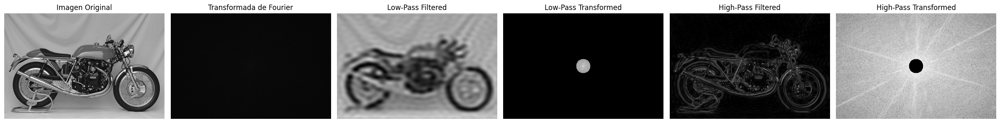

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def load_image(image_path):
    """Carga una imagen y la convierte en escala de grises."""
    img = Image.open(image_path).convert('L')
    img_array = np.array(img)
    return img_array

def fft_transform(img_array):
    """Realiza la Transformada de Fourier y retorna el resultado y el espectro desplazado."""
    fft_result = np.fft.fft2(img_array)
    fft_shifted = np.fft.fftshift(fft_result)  # Desplaza el cero de frecuencia al centro
    return fft_shifted

def ifft_transform(fft_shifted):
    """Realiza la Transformada Inversa de Fourier."""
    ifft_shifted = np.fft.ifftshift(fft_shifted)  # Vuelve a colocar el cero de frecuencia en la esquina
    img_back = np.fft.ifft2(ifft_shifted)
    return np.abs(img_back)

def apply_low_pass_filter(fft_shifted, radius):
    """Aplica un filtro pasa-bajos sobre el espectro de Fourier."""
    rows, cols = fft_shifted.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.zeros((rows, cols), dtype=bool)
    y, x = np.ogrid[:rows, :cols]
    mask_area = (x - center_col)**2 + (y - center_row)**2 <= radius**2
    mask[mask_area] = True
    fft_shifted[~mask] = 0
    return fft_shifted

def apply_high_pass_filter(fft_shifted, radius):
    """Aplica un filtro pasa-altos sobre el espectro de Fourier."""
    rows, cols = fft_shifted.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.zeros((rows, cols), dtype=bool)
    y, x = np.ogrid[:rows, :cols]
    mask_area = (x - center_col)**2 + (y - center_row)**2 <= radius**2
    mask[mask_area] = True
    fft_shifted[mask] = 0
    return fft_shifted

def plot_images(images, titles):
    """Muestra un mosaico de imágenes."""
    plt.figure(figsize=(24, 12))  # Aumenta el tamaño de la figura aquí
    for i, (image, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        if "Transformed" in title:
            plt.imshow(np.log(1 + np.abs(image)), cmap='gray')  # Log scale para mejorar la visualización
        else:
            plt.imshow(image, cmap='gray', vmin=0, vmax=255)
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()


def main():
    # Cargar imagen

    # Obtener transformada de Fourier y visualización
    fft_shifted = fft_transform(image)
    fft_magnitude = np.log(1 + np.abs(fft_shifted))  # Usar escala logarítmica para visualizar mejor

    # Aplicar filtros y reconstruir
    fft_low_pass = apply_low_pass_filter(fft_shifted.copy(), 20)
    img_low_pass = ifft_transform(fft_low_pass.copy())
    fft_high_pass = apply_high_pass_filter(fft_shifted.copy(), 20)
    img_high_pass = ifft_transform(fft_high_pass.copy())

    # Mostrar imágenes
    images = [image, fft_magnitude, img_low_pass, fft_low_pass, img_high_pass, fft_high_pass]
    titles = ['Imagen Original', 'Transformada de Fourier', 'Low-Pass Filtered', 'Low-Pass Transformed', 'High-Pass Filtered', 'High-Pass Transformed']
    plot_images(images, titles)

main()


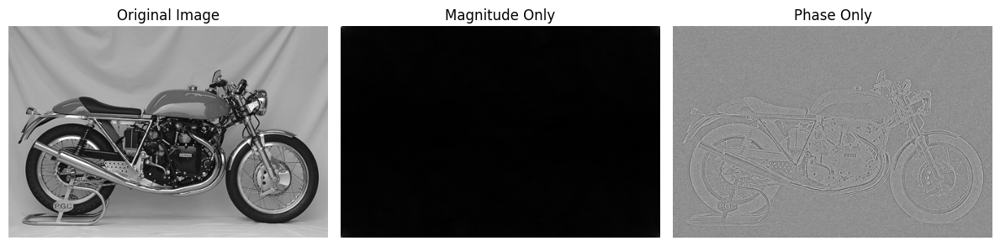

In [ ]:
import numpy as np
import matplotlib.pyplot as plt



def fft_image(img_array):
    """Aplica FFT a la imagen y devuelve la magnitud y la fase."""
    fft_result = np.fft.fft2(img_array)
    fft_shifted = np.fft.fftshift(fft_result)  # Centrar el espectro para visualización y manipulación
    magnitude = np.abs(fft_shifted)
    phase = np.angle(fft_shifted)
    return magnitude, phase

def reconstruct_magnitude_only(magnitude):
    """Reconstruye la imagen utilizando solo la magnitud (fase a cero)."""
    phase = np.zeros(magnitude.shape)
    complex_image = np.exp(1j * phase) * magnitude
    ifft_result = np.fft.ifftshift(complex_image)  # Descentrar antes de la transformada inversa
    return np.fft.ifft2(ifft_result).real

def reconstruct_phase_only(phase):
    """Reconstruye la imagen utilizando solo la fase (magnitud normalizada a un valor apropiado)."""
    magnitude = np.full(phase.shape, np.mean(phase))  # Utiliza un valor de magnitud que sea más apropiado
    complex_image = np.exp(1j * phase) * magnitude
    return np.fft.ifft2(np.fft.ifftshift(complex_image)).real

def plot_images(images, titles):
    """Dibuja un mosaico de imágenes."""
    plt.figure(figsize=(12, 4))
    for i, (image, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        plt.imshow(image, cmap='gray', vmin=np.min(image), vmax=np.max(image))  # Ajusta rango para cada imagen
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

def main():
    # Asegúrate de cambiar 'path_to_your_image.jpg' a la ruta correcta de tu imagen
    img_array = image

    # Obtener magnitud y fase con FFT
    magnitude, phase = fft_image(img_array)

    # Reconstruir imágenes
    img_magnitude_only = reconstruct_magnitude_only(magnitude)
    img_phase_only = reconstruct_phase_only(phase)

    # Mostrar imágenes
    plot_images(
        [img_array, img_magnitude_only, img_phase_only],
        ['Original Image', 'Magnitude Only', 'Phase Only']
    )

# Ejecutar el código principal
main()


/content/drive/My Drive


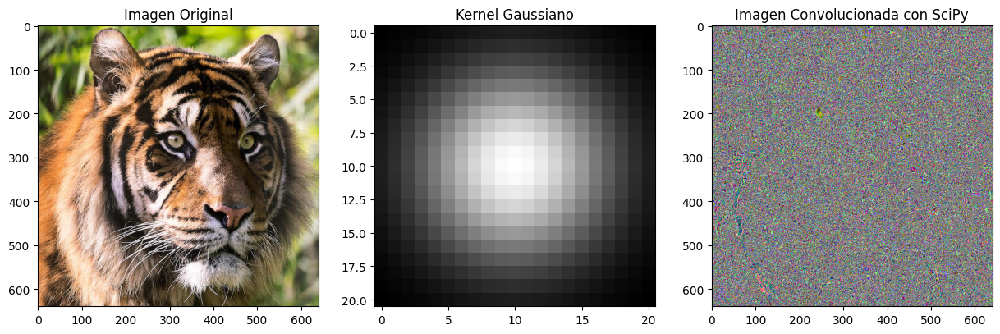

Tiempo de convolución con fftconvolve: 0.11200761795043945 segundos
Tiempo de convolución con fftconvolve: 0.11010384559631348 segundos
Tiempo de convolución con fftconvolve: 0.12176275253295898 segundos


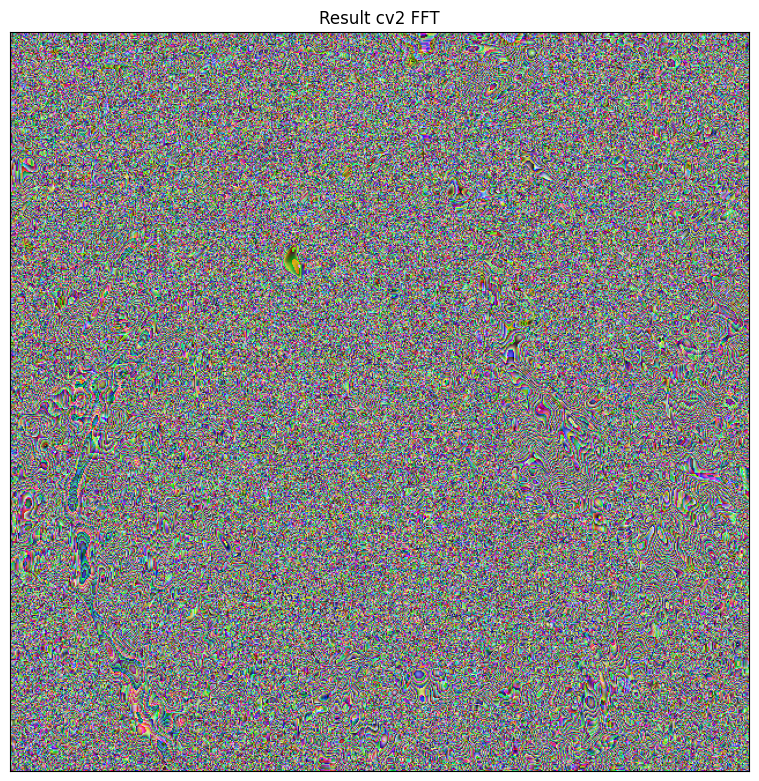

Máximo valor en la diferencia entre las imágenes: 0.0


In [ ]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy.signal import convolve2d  # Importar scipy.signal.convolve2d
from scipy.ndimage import convolve  # Importar scipy.ndimage.convolve

# Cambiamos el directorio de trabajo
%cd '/content/drive/My Drive'

# Verificamos el directorio actual
%pwd

# Esto permite mostrar imágenes y guardarlas en las celdas
%matplotlib inline

# Definición para leer archivos en una ruta específica
get_image = lambda route: os.path.join('/content/drive/My Drive/images (1)', route)

# Función para la convolución utilizando scipy.signal.convolve2d
def convolution_scipy(image, kernel):
    output = np.zeros_like(image)
    for c in range(image.shape[2]):
        output[:, :, c] = convolve2d(image[:, :, c], kernel, mode='same', boundary='fill', fillvalue=0)
    return output

# Cargar una imagen en color
image_path = get_image('tigre.jpeg')
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convertir a RGB

# Generar un kernel de prueba simple (gaussiano)
X, Y = np.mgrid[-1:1:21j, -1:1:21j]
g = np.exp(-((X**2 + Y**2) / (2.0 * 0.5**2)))

# Aplicar el filtro a cada canal de la imagen usando scipy.ndimage.convolve
conv_image_scipy = np.zeros_like(image)
for i in range(3):  # Suponemos que la imagen tiene 3 canales
    conv_image_scipy[:, :, i] = convolve(image[:, :, i], g, mode='constant', cval=0.0)

# Ajustar la imagen resultante según sea necesario
conv_image_scipy = np.clip(conv_image_scipy, 0, 255).astype(np.uint8)

# Mostrar y guardar las imágenes
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title('Imagen Original')

plt.subplot(1, 3, 2)
plt.imshow(g, cmap='gray')
plt.title('Kernel Gaussiano')

plt.subplot(1, 3, 3)
plt.imshow(conv_image_scipy)
plt.title('Imagen Convolucionada con SciPy')

plt.savefig('convolution_results_color_scipy.png')
plt.show()

# Guardar las imágenes
plt.imsave('image.png', image)
plt.imsave('g.png', g, cmap='gray')
plt.imsave('conv_image_scipy_correct.png', conv_image_scipy)
conv_image_fft = convolution_fft_diapositiva2(image, g)
displayIm(conv_image_fft,'Result cv2 FFT')



# Calcular y mostrar la diferencia
difference = cv2.absdiff(conv_image_scipy.astype(np.float32), conv_image_fft.astype(np.float32))
max_difference = np.max(difference)  # Obtener el valor máximo de la diferencia
print("Máximo valor en la diferencia entre las imágenes:", round(max_difference, 2))